In [1]:
import os                            #for interacting with the os
import pickle                        #for serializing and de-serializing obect structures
import time

import matplotlib.pyplot as plt      #for the plots
import numpy as np                   #numerical python
import torch                         #for deep learning
import torch.nn as nn
import torchvision.datasets as datasets           #to get the datasets
import torchvision.transforms as transforms       #for image transformations
from torch.utils.data import DataLoader           #for loading the data
from tqdm import tqdm                             #for creating progress bars

In [2]:
# Network Parameters
num_hidden_1 = 256  # 1st layer num features
num_hidden_2 = 512  # 2nd layer num features 
num_hidden_3 = 1024 # 3rd layer num features 

In [3]:
class Generator(nn.Module):
    """Image generator
    
    Takes a noise vector as input and syntheses a single channel image accordingly
    """

    def __init__(self, input_dims, output_dims):
        """Init function
        
        Declare the network structure as indicated in CW2 Guidance
        
        Arguments:
            input_dims {int} -- Dimension of input noise vector
            output_dims {int} -- Dimension of the output vector (flatten image)
        """
        super(Generator, self).__init__()
        ###  TODO: Change the architecture and value as CW2 Guidance required
        #input has dimension 100, 1st hidden layer 256 and activation of Leaky Relu
        self.fc1 = nn.Sequential(nn.Linear(input_dims, num_hidden_1),
                                 nn.LeakyReLU(0.2)) 
        
        #1st hidden layer 256 with output of 512 and LeakyRelu as activation
        self.fc2 = nn.Sequential(nn.Linear(num_hidden_1, num_hidden_2),
                                 nn.LeakyReLU(0.2))
        
        #2nd hidden layer 512 with output of 1024 and LeakyRelu as activation
        self.fc3 = nn.Sequential(nn.Linear(num_hidden_2, num_hidden_3),
                                 nn.LeakyReLU(0.2))
                
        # output layer of 784 and activation of tanh
        self.fc4 = nn.Sequential(nn.Linear(num_hidden_3, output_dims), 
                                 nn.Tanh())

    def forward(self, x):
        """Forward function
        
        Arguments:
            x {Tensor} -- a batch of noise vectors in shape (<batch_size>x<input_dims>)
        
        Returns:
            Tensor -- a batch of flatten image in shape (<batch_size>x<output_dims>)
        """
        ###  TODO 1: modify to be consistent with the network structure
        x = self.fc1(x)
        x = self.fc2(x)
        x = self.fc3(x)
        x = self.fc4(x)
        return x

In [4]:
class Discriminator(nn.Module):
    """Image discriminator
    
    Takes a image as input and predict if it is real from the dataset or fake synthesised by the generator
    """

    def __init__(self, input_dims, output_dims=1):
        """Init function
        
        Declare the discriminator network structure as indicated in CW2 Guidance
        
        Arguments:
            input_dims {int} -- Dimension of the flatten input images
        
        Keyword Arguments:
            output_dims {int} -- Predicted probability (default: {1})
        """
        super(Discriminator, self).__init__()

        ###  TODO: Change the architecture and value as CW2 Guidance required
        #input dimension of 784, with hidden layer of 1024, along with activation as LeakyReLU and dropout
        self.fc1 = nn.Sequential(nn.Linear(input_dims, num_hidden_3),
                                 nn.LeakyReLU(0.2)
                                 #nn.Dropout(0.3)
                                )
        
        #1024 x 512, along with activation as LeakyReLU and dropout
        self.fc2 = nn.Sequential(nn.Linear(num_hidden_3, num_hidden_2),
                                 nn.LeakyReLU(0.2)
                                 #nn.Dropout(0.3)
                                )
        
        #512 x 256, along with activation as LeakyReLU and dropout
        self.fc3 = nn.Sequential(nn.Linear(num_hidden_2, num_hidden_1),
                                 nn.LeakyReLU(0.2)
                                 #nn.Dropout(0.3)
                                )
        
        self.fc4 = nn.Sequential(nn.Linear(num_hidden_1, output_dims),
                                 nn.Sigmoid()
                                )

    def forward(self, x):
        """Forward function
        
        Arguments:
            x {Tensor} -- a batch of 2D image in shape (<batch_size>xHxW)
        
        Returns:
            Tensor -- predicted probabilities (<batch_size>)
        """
        ###  TODO 2: modify to be consistent with the network structure
        x = self.fc1(x)
        x = self.fc2(x)
        x = self.fc3(x)
        x = self.fc4(x)
        return x

In [5]:
def show_result(G_net, z_, num_epoch, show=True, save=True, path='result.png'):
    """Result visualisation
    
    Show and save the generated figures in the grid fashion
    
    Arguments:
        G_net {[nn.Module]} -- The generator instant
        z_ {[Tensor]} -- Input noise vectors
        num_epoch {[int]} -- Indicate how many epoch has the generator been trained
    
    Keyword Arguments:
        show {bool} -- If to display the images (default: {False})
        save {bool} -- If to store the images (default: {False})
        path {str} -- path to store the images (default: {'result.png'})
    """
    ###  TODO: complete the rest of part
    # hint: use plt.subplots to construct grid
    # hint: use plt.imshow and plt.savefig to display and store the images
    if torch.cuda.is_available():
          generated_samples = G_net(z_).detach().cpu().numpy()
    else:
          generated_samples = G_net(z_)

    plt.figure(figsize=(5,5))
    for i in range(25):
        plt.subplot(5,5,i+1)
        if torch.cuda.is_available():
              img = generated_samples[i]
        else:
              img = generated_samples[i].detach()
        plt.imshow(img.reshape((28,28)),cmap='gray')
        plt.xticks([])
        plt.yticks([])
    plt.tight_layout()
    plt.subplots_adjust(wspace=0, hspace=0)
    
    if save:
        plt.savefig(path)

    if show:
        plt.show()
    else:
        plt.close()

In [6]:
def show_train_hist(hist, show=True, save=True, path='Train_hist.png'):
    """Loss tracker
    
    Plot the losses of generator and discriminator independently to see the trend
    
    Arguments:
        hist {[dict]} -- Tracking variables
    
    Keyword Arguments:
        show {bool} -- If to display the figure (default: {False})
        save {bool} -- If to store the figure (default: {False})
        path {str} -- path to store the figure (default: {'Train_hist.png'})
    """
    x = range(len(hist['D_losses']))

    y1 = hist['D_losses']
    y2 = hist['G_losses']

    plt.plot(x, y1, label='D_loss')
    plt.plot(x, y2, label='G_loss')

    plt.xlabel('Epoch')
    plt.ylabel('Loss')

    plt.legend(loc=4)
    plt.grid(True)
    plt.tight_layout()

    if save:
        plt.savefig(path)

    if show:
        plt.show()
    else:
        plt.close()

In [7]:
def create_noise(num, dim):
    """Noise constructor
    
    returns a tensor filled with random numbers from a standard normal distribution
    
    Arguments:
        num {int} -- Number of vectors
        dim {int} -- Dimension of vectors
    
    Returns:
        [Tensor] -- the generated noise vector batch
    """
    return torch.randn(num, dim)

In [8]:
# initialise the device for training, if gpu is available, device = 'cuda', else: device = 'cpu'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
data_dir = './MNIST_data/'
save_dir = './MNIST_GAN_results_nodropout/'
image_save_dir = './MNIST_GAN_results_nodropout/results'

In [9]:
# create folder if not exist
if not os.path.exists(save_dir):
    os.mkdir(save_dir)
if not os.path.exists(image_save_dir):
    os.mkdir(image_save_dir)

In [10]:
# training parameters
batch_size = 100
learning_rate = 0.0002
epochs = 100

In [11]:
# parameters for Models
image_size = 28
G_input_dim = 100
G_output_dim = image_size * image_size
D_input_dim = image_size * image_size
D_output_dim = 1

In [12]:
# construct the dataset and data loader
transform = transforms.Compose([transforms.ToTensor(),
                                transforms.Normalize(mean=(0.5,), std=(0.5,))])
train_data = datasets.MNIST(root='~/.pytorch/MNIST_data/', train=True, transform=transform, download=True)
train_loader = DataLoader(dataset=train_data, batch_size=batch_size, shuffle=True)

In [13]:
# declare the generator and discriminator networks    
G_net = Generator(G_input_dim, G_output_dim).to(device)
D_net = Discriminator(D_input_dim, D_output_dim).to(device)

In [14]:
# Binary Cross Entropy Loss function
criterion = nn.BCELoss().to(device)

In [15]:
# Initialise the Optimizers
G_optimizer = torch.optim.Adam(G_net.parameters(), lr=learning_rate)
D_optimizer = torch.optim.Adam(D_net.parameters(), lr=learning_rate)

In [16]:
# tracking variables
train_hist = {}
train_hist['D_losses'] = []
train_hist['G_losses'] = []
train_hist['per_epoch_ptimes'] = []
train_hist['total_ptime'] = []

In [17]:
start_time = time.time()

100%|██████████| 600/600 [00:48<00:00, 12.36it/s]


Epoch 1 of 100 with 48.55 s
Generator loss: 5.16216711, Discriminator loss: 0.48638017


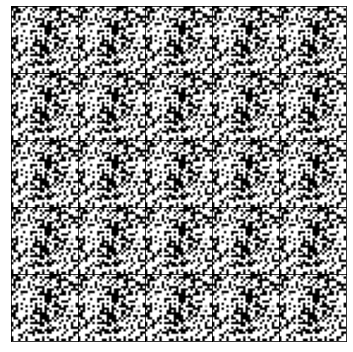

100%|██████████| 600/600 [00:47<00:00, 12.53it/s]


Epoch 2 of 100 with 47.88 s
Generator loss: 10.53630705, Discriminator loss: 0.00016242


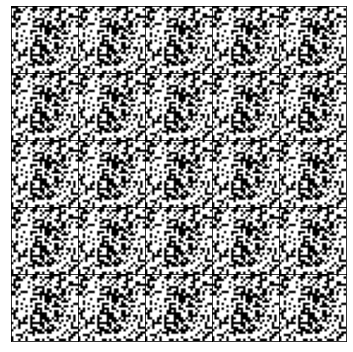

100%|██████████| 600/600 [00:47<00:00, 12.56it/s]


Epoch 3 of 100 with 47.77 s
Generator loss: 12.20073812, Discriminator loss: 0.00004461


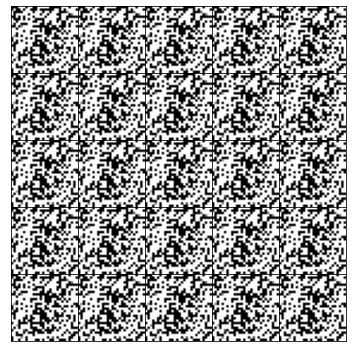

100%|██████████| 600/600 [00:48<00:00, 12.44it/s]


Epoch 4 of 100 with 48.25 s
Generator loss: 12.28877530, Discriminator loss: 0.00003084


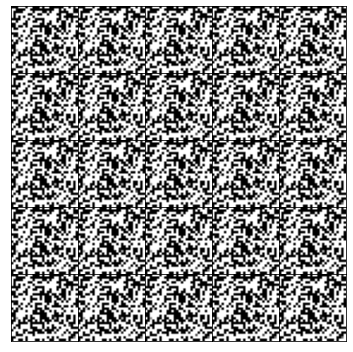

100%|██████████| 600/600 [01:16<00:00,  7.80it/s]


Epoch 5 of 100 with 76.93 s
Generator loss: 22.21807256, Discriminator loss: 0.01826816


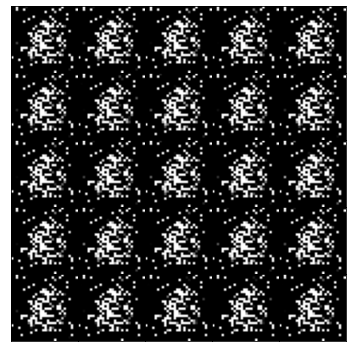

100%|██████████| 600/600 [00:51<00:00, 11.64it/s]


Epoch 6 of 100 with 51.56 s
Generator loss: 45.03901258, Discriminator loss: 0.00004866


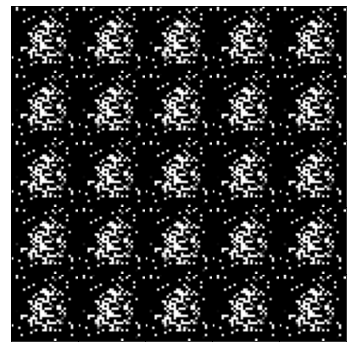

100%|██████████| 600/600 [00:48<00:00, 12.35it/s]


Epoch 7 of 100 with 48.59 s
Generator loss: 42.54779413, Discriminator loss: 0.00002003


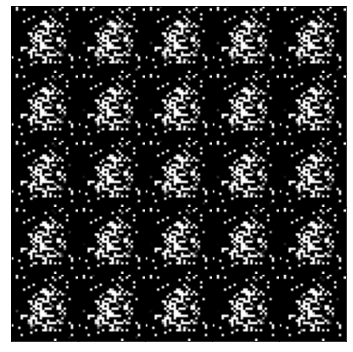

100%|██████████| 600/600 [00:48<00:00, 12.30it/s]


Epoch 8 of 100 with 48.77 s
Generator loss: 31.29383751, Discriminator loss: 0.00027530


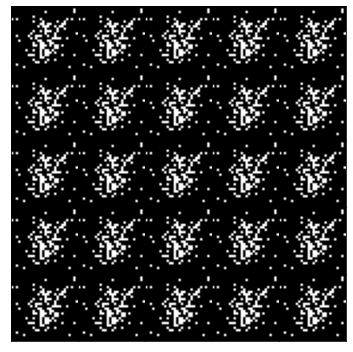

100%|██████████| 600/600 [00:48<00:00, 12.38it/s]


Epoch 9 of 100 with 48.49 s
Generator loss: 12.12995736, Discriminator loss: 0.00003489


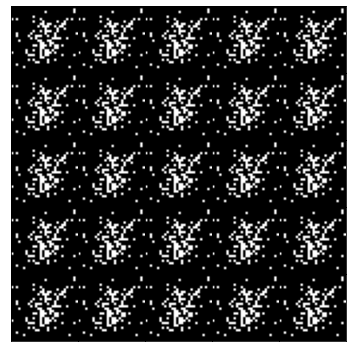

100%|██████████| 600/600 [00:48<00:00, 12.25it/s]


Epoch 10 of 100 with 48.99 s
Generator loss: 13.38521567, Discriminator loss: 0.00001047


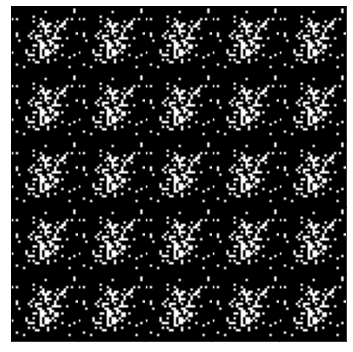

100%|██████████| 600/600 [00:49<00:00, 12.11it/s]


Epoch 11 of 100 with 49.54 s
Generator loss: 14.13265814, Discriminator loss: 0.00000535


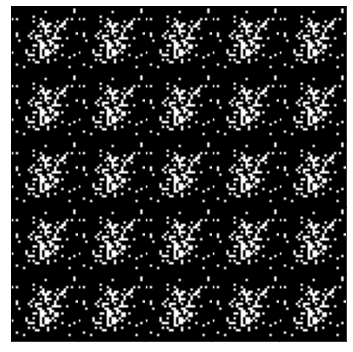

100%|██████████| 600/600 [00:50<00:00, 11.98it/s]


Epoch 12 of 100 with 50.10 s
Generator loss: 14.58284185, Discriminator loss: 0.00000325


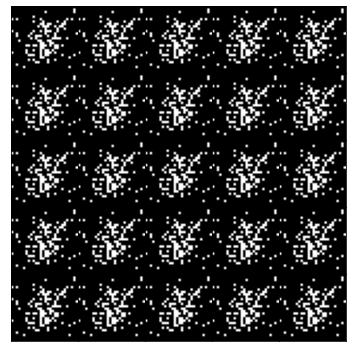

100%|██████████| 600/600 [00:49<00:00, 12.22it/s]


Epoch 13 of 100 with 49.09 s
Generator loss: 14.78482047, Discriminator loss: 0.00000225


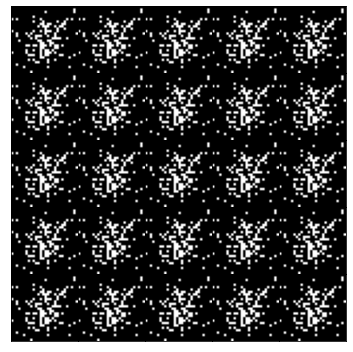

100%|██████████| 600/600 [00:48<00:00, 12.25it/s]


Epoch 14 of 100 with 48.99 s
Generator loss: 85.63536916, Discriminator loss: 0.02071455


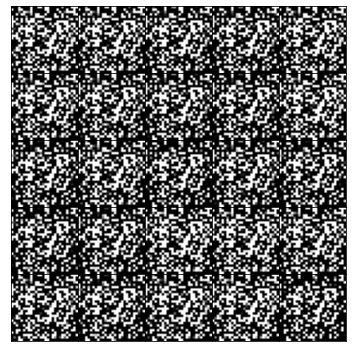

100%|██████████| 600/600 [00:51<00:00, 11.70it/s]


Epoch 15 of 100 with 51.30 s
Generator loss: 100.00000000, Discriminator loss: 0.00000227


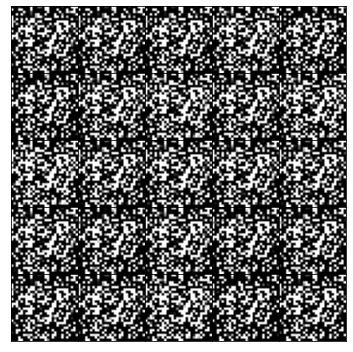

100%|██████████| 600/600 [00:49<00:00, 12.06it/s]


Epoch 16 of 100 with 49.77 s
Generator loss: 100.00000000, Discriminator loss: 0.00000175


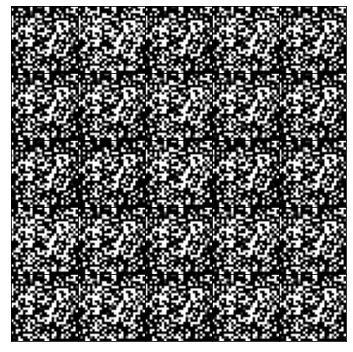

100%|██████████| 600/600 [00:50<00:00, 11.87it/s]


Epoch 17 of 100 with 50.56 s
Generator loss: 100.00000000, Discriminator loss: 0.00000135


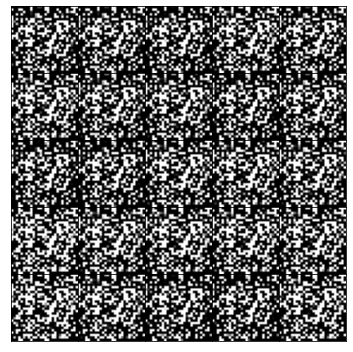

100%|██████████| 600/600 [00:50<00:00, 11.91it/s]


Epoch 18 of 100 with 50.39 s
Generator loss: 100.00000000, Discriminator loss: 0.00000103


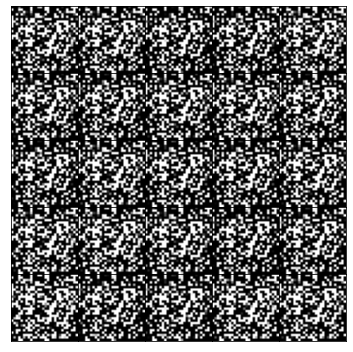

100%|██████████| 600/600 [00:50<00:00, 11.89it/s]


Epoch 19 of 100 with 50.45 s
Generator loss: 100.00000000, Discriminator loss: 0.00000079


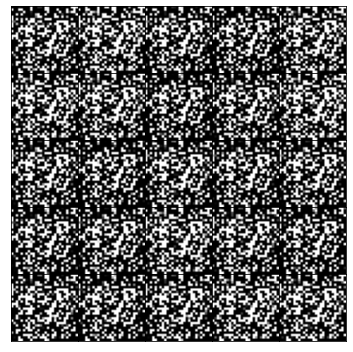

100%|██████████| 600/600 [00:50<00:00, 11.78it/s]


Epoch 20 of 100 with 50.93 s
Generator loss: 100.00000000, Discriminator loss: 0.00000060


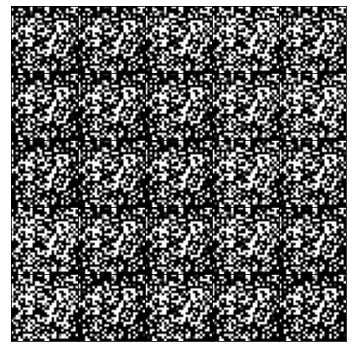

100%|██████████| 600/600 [00:51<00:00, 11.71it/s]


Epoch 21 of 100 with 51.23 s
Generator loss: 100.00000000, Discriminator loss: 0.00000045


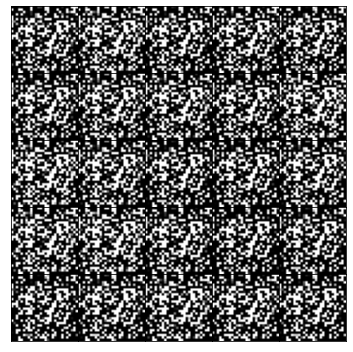

100%|██████████| 600/600 [00:50<00:00, 11.92it/s]


Epoch 22 of 100 with 50.33 s
Generator loss: 100.00000000, Discriminator loss: 0.00000034


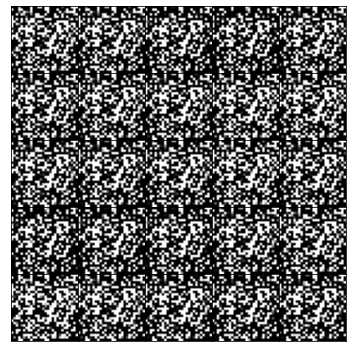

100%|██████████| 600/600 [00:49<00:00, 12.05it/s]


Epoch 23 of 100 with 49.79 s
Generator loss: 100.00000000, Discriminator loss: 0.00000026


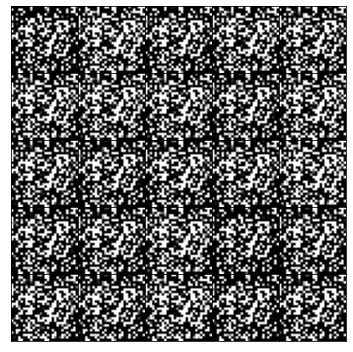

100%|██████████| 600/600 [00:49<00:00, 12.18it/s]


Epoch 24 of 100 with 49.26 s
Generator loss: 100.00000000, Discriminator loss: 0.00000019


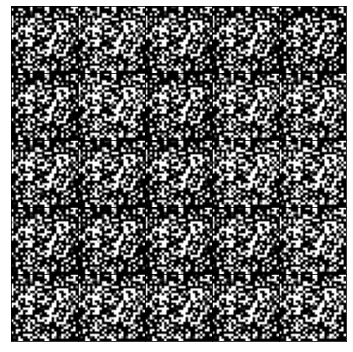

100%|██████████| 600/600 [00:49<00:00, 12.23it/s]


Epoch 25 of 100 with 49.07 s
Generator loss: 100.00000000, Discriminator loss: 0.00000015


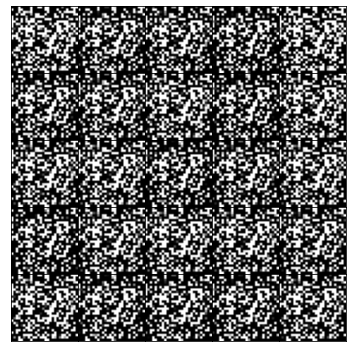

100%|██████████| 600/600 [00:49<00:00, 12.06it/s]


Epoch 26 of 100 with 49.74 s
Generator loss: 100.00000000, Discriminator loss: 0.00000011


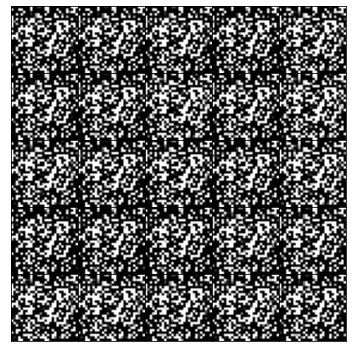

100%|██████████| 600/600 [00:49<00:00, 12.12it/s]


Epoch 27 of 100 with 49.51 s
Generator loss: 100.00000000, Discriminator loss: 0.00000008


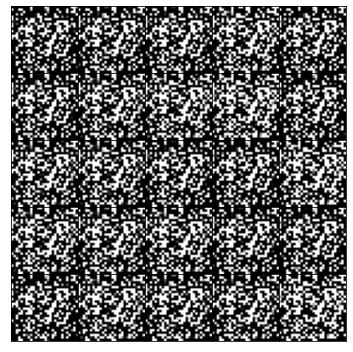

100%|██████████| 600/600 [00:50<00:00, 11.95it/s]


Epoch 28 of 100 with 50.19 s
Generator loss: 100.00000000, Discriminator loss: 0.00000006


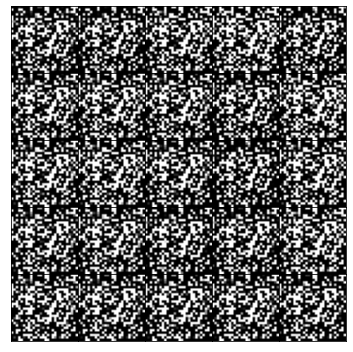

100%|██████████| 600/600 [00:49<00:00, 12.00it/s]


Epoch 29 of 100 with 49.98 s
Generator loss: 100.00000000, Discriminator loss: 0.00000005


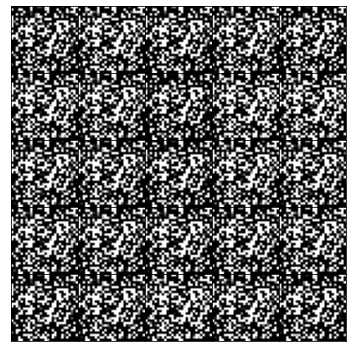

100%|██████████| 600/600 [00:50<00:00, 11.87it/s]


Epoch 30 of 100 with 50.56 s
Generator loss: 100.00000000, Discriminator loss: 0.00000003


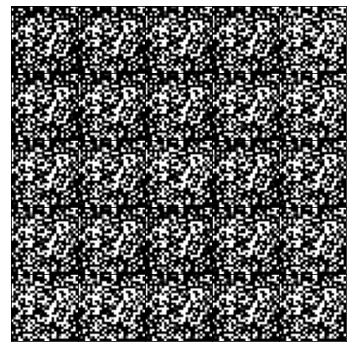

100%|██████████| 600/600 [00:51<00:00, 11.71it/s]


Epoch 31 of 100 with 51.26 s
Generator loss: 100.00000000, Discriminator loss: 0.00000003


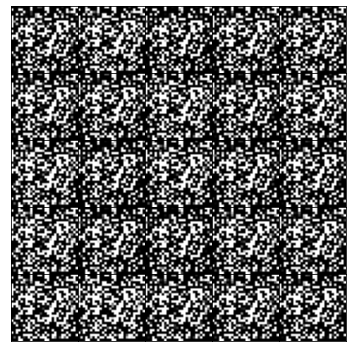

100%|██████████| 600/600 [00:49<00:00, 12.00it/s]


Epoch 32 of 100 with 49.99 s
Generator loss: 100.00000000, Discriminator loss: 0.00000002


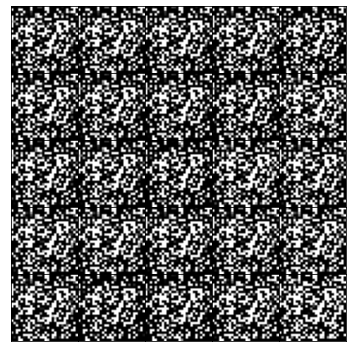

100%|██████████| 600/600 [00:49<00:00, 12.14it/s]


Epoch 33 of 100 with 49.41 s
Generator loss: 100.00000000, Discriminator loss: 0.00000001


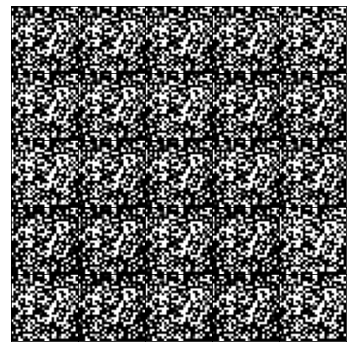

100%|██████████| 600/600 [00:49<00:00, 12.15it/s]


Epoch 34 of 100 with 49.37 s
Generator loss: 100.00000000, Discriminator loss: 0.00000001


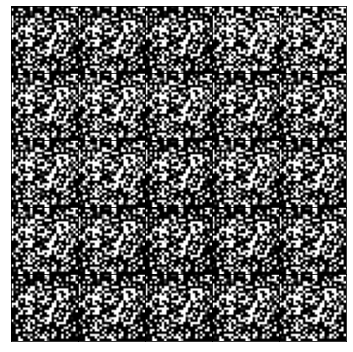

100%|██████████| 600/600 [00:49<00:00, 12.15it/s]


Epoch 35 of 100 with 49.38 s
Generator loss: 100.00000000, Discriminator loss: 0.00000001


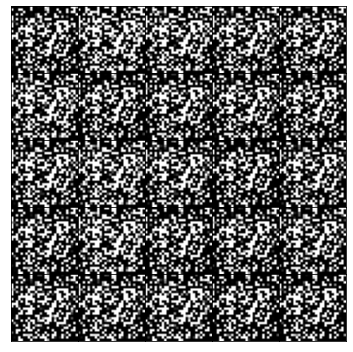

100%|██████████| 600/600 [00:49<00:00, 12.20it/s]


Epoch 36 of 100 with 49.20 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


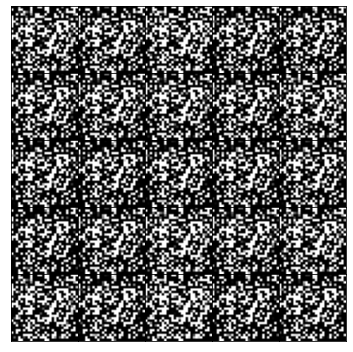

100%|██████████| 600/600 [00:49<00:00, 12.17it/s]


Epoch 37 of 100 with 49.30 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


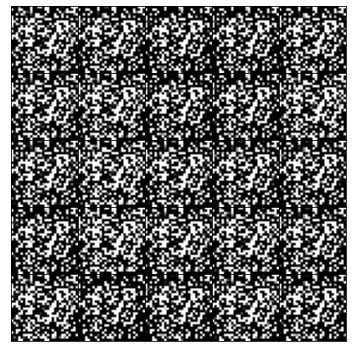

100%|██████████| 600/600 [00:49<00:00, 12.18it/s]


Epoch 38 of 100 with 49.26 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


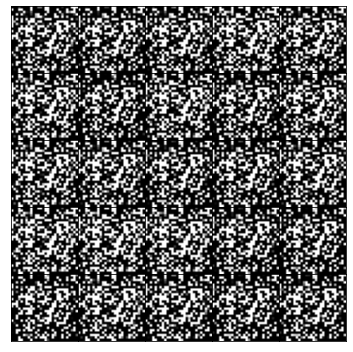

100%|██████████| 600/600 [00:49<00:00, 12.16it/s]


Epoch 39 of 100 with 49.34 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


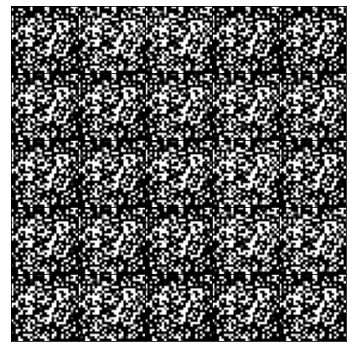

100%|██████████| 600/600 [00:49<00:00, 12.12it/s]


Epoch 40 of 100 with 49.49 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


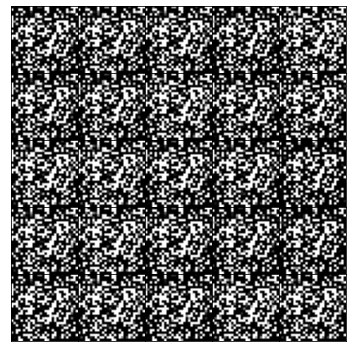

100%|██████████| 600/600 [00:48<00:00, 12.25it/s]


Epoch 41 of 100 with 48.99 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


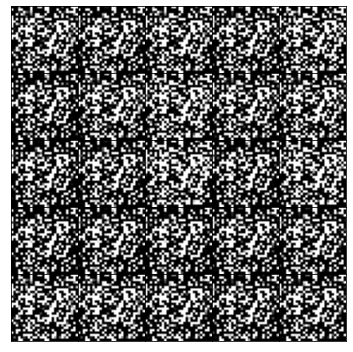

100%|██████████| 600/600 [00:49<00:00, 12.18it/s]


Epoch 42 of 100 with 49.27 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


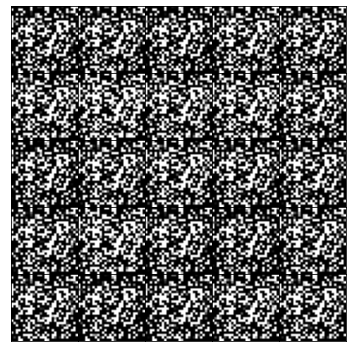

100%|██████████| 600/600 [00:49<00:00, 12.05it/s]


Epoch 43 of 100 with 49.81 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


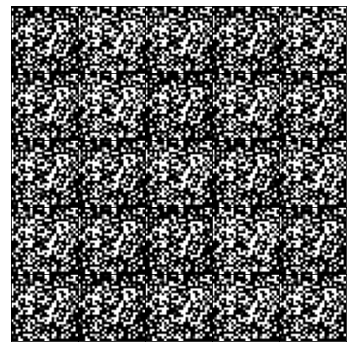

100%|██████████| 600/600 [00:49<00:00, 12.09it/s]


Epoch 44 of 100 with 49.61 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


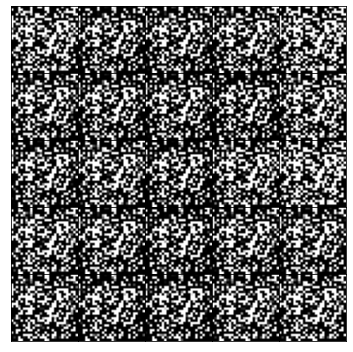

100%|██████████| 600/600 [00:49<00:00, 12.11it/s]


Epoch 45 of 100 with 49.53 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


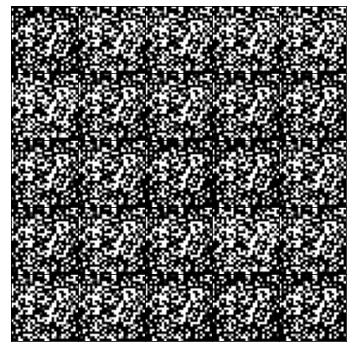

100%|██████████| 600/600 [00:49<00:00, 12.12it/s]


Epoch 46 of 100 with 49.52 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


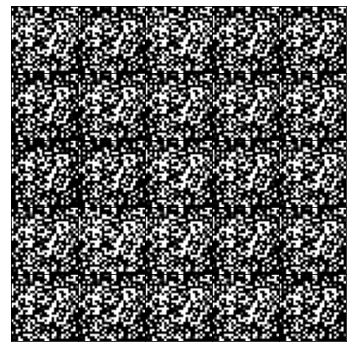

100%|██████████| 600/600 [00:49<00:00, 12.18it/s]


Epoch 47 of 100 with 49.25 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


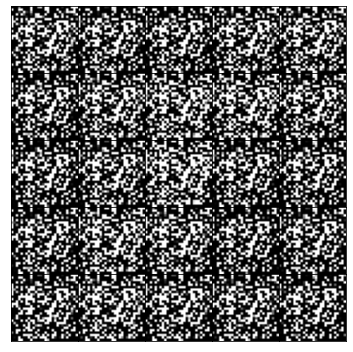

100%|██████████| 600/600 [00:49<00:00, 12.13it/s]


Epoch 48 of 100 with 49.45 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


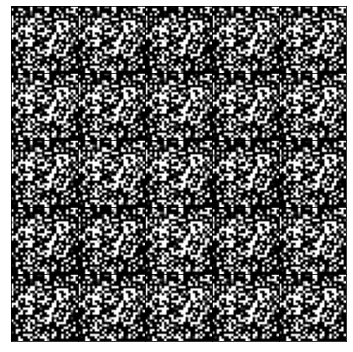

100%|██████████| 600/600 [00:49<00:00, 12.17it/s]


Epoch 49 of 100 with 49.29 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


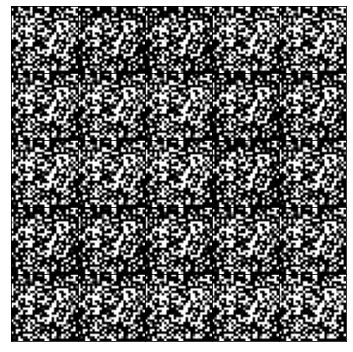

100%|██████████| 600/600 [00:49<00:00, 12.12it/s]


Epoch 50 of 100 with 49.52 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


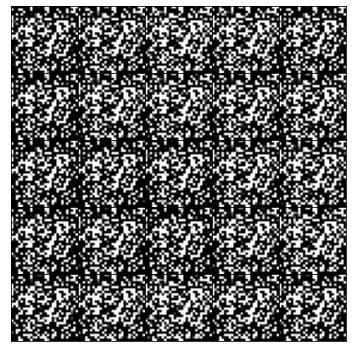

100%|██████████| 600/600 [00:49<00:00, 12.19it/s]


Epoch 51 of 100 with 49.21 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


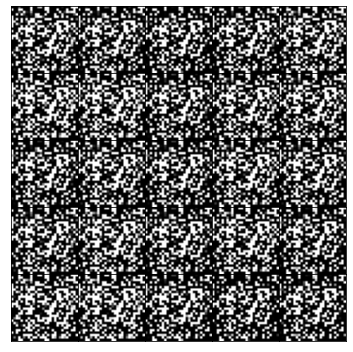

100%|██████████| 600/600 [00:49<00:00, 12.12it/s]


Epoch 52 of 100 with 49.49 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


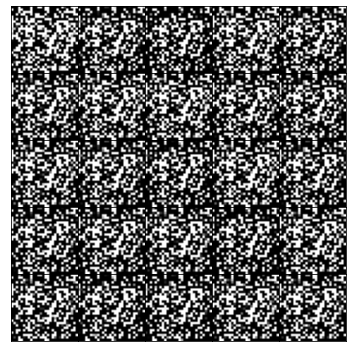

100%|██████████| 600/600 [00:49<00:00, 12.12it/s]


Epoch 53 of 100 with 49.51 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


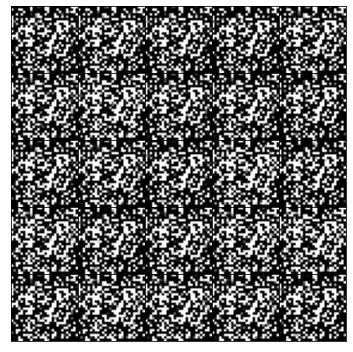

100%|██████████| 600/600 [00:49<00:00, 12.23it/s]


Epoch 54 of 100 with 49.06 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


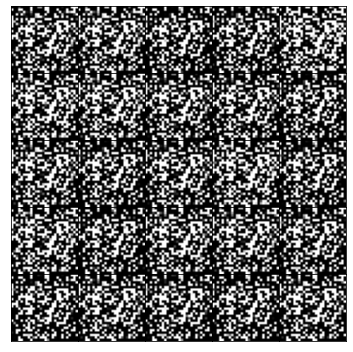

100%|██████████| 600/600 [00:49<00:00, 12.20it/s]


Epoch 55 of 100 with 49.18 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


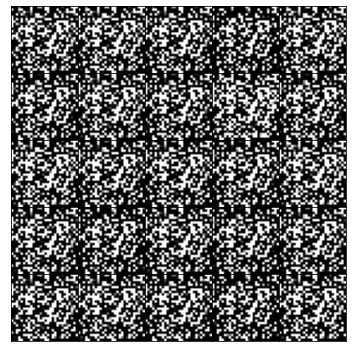

100%|██████████| 600/600 [00:49<00:00, 12.22it/s]


Epoch 56 of 100 with 49.10 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


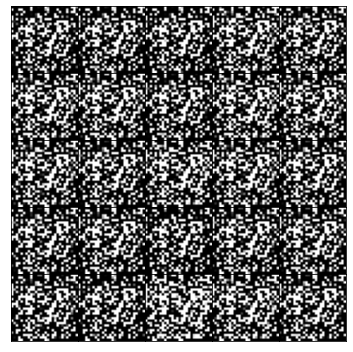

100%|██████████| 600/600 [00:49<00:00, 12.18it/s]


Epoch 57 of 100 with 49.26 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


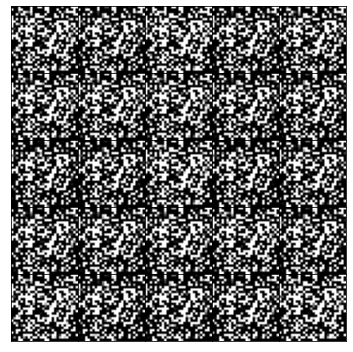

100%|██████████| 600/600 [00:49<00:00, 12.19it/s]


Epoch 58 of 100 with 49.23 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


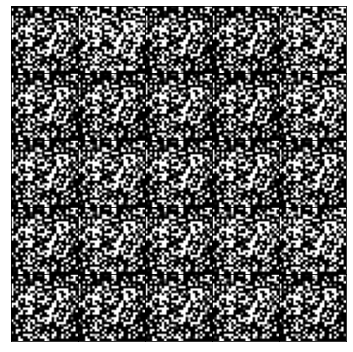

100%|██████████| 600/600 [00:49<00:00, 12.20it/s]


Epoch 59 of 100 with 49.20 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


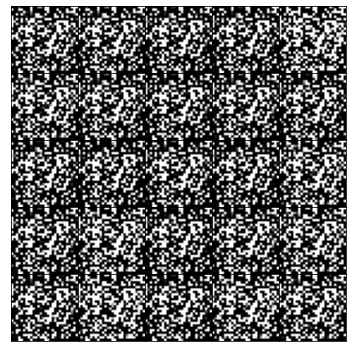

100%|██████████| 600/600 [00:49<00:00, 12.20it/s]


Epoch 60 of 100 with 49.19 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


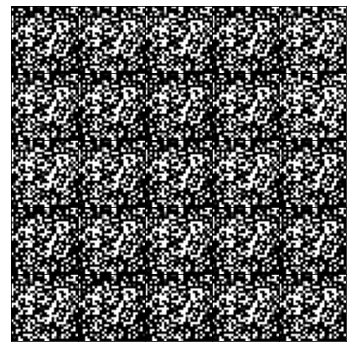

100%|██████████| 600/600 [00:49<00:00, 12.19it/s]


Epoch 61 of 100 with 49.22 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


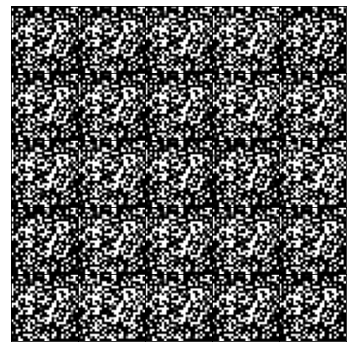

100%|██████████| 600/600 [00:48<00:00, 12.26it/s]


Epoch 62 of 100 with 48.93 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


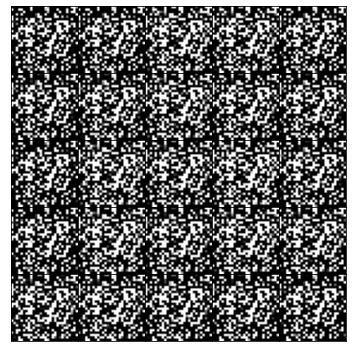

100%|██████████| 600/600 [00:49<00:00, 12.22it/s]


Epoch 63 of 100 with 49.10 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


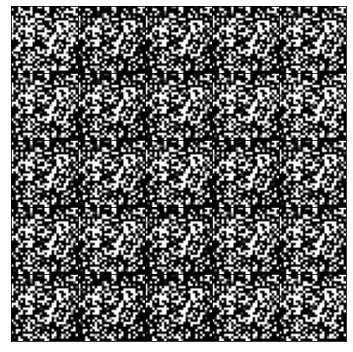

100%|██████████| 600/600 [00:49<00:00, 12.21it/s]


Epoch 64 of 100 with 49.12 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


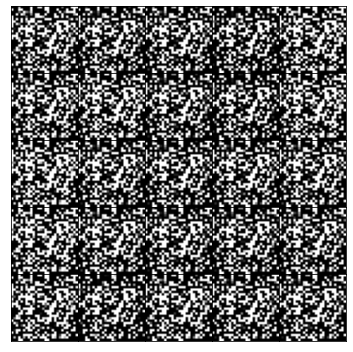

100%|██████████| 600/600 [00:49<00:00, 12.14it/s]


Epoch 65 of 100 with 49.41 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


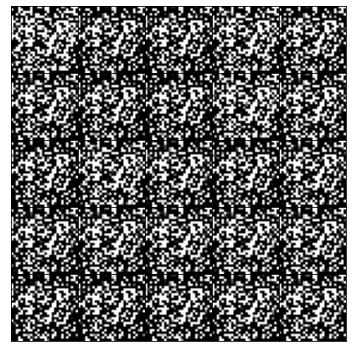

100%|██████████| 600/600 [22:33<00:00,  2.26s/it]    


Epoch 66 of 100 with 1353.08 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


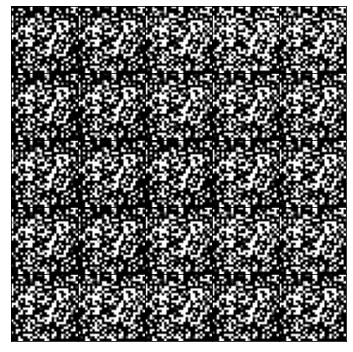

100%|██████████| 600/600 [00:49<00:00, 12.09it/s]


Epoch 67 of 100 with 49.61 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


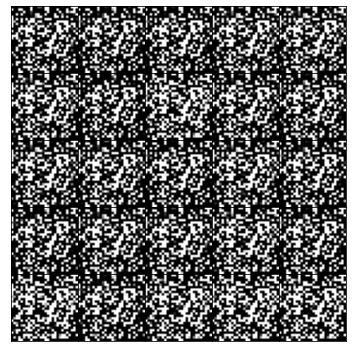

100%|██████████| 600/600 [00:49<00:00, 12.11it/s]


Epoch 68 of 100 with 49.54 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


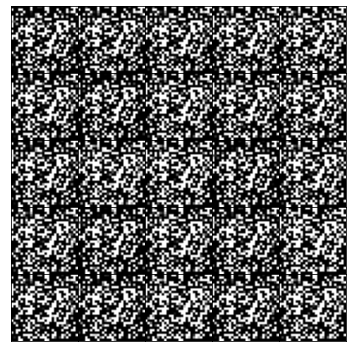

100%|██████████| 600/600 [00:49<00:00, 12.02it/s]


Epoch 69 of 100 with 49.91 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


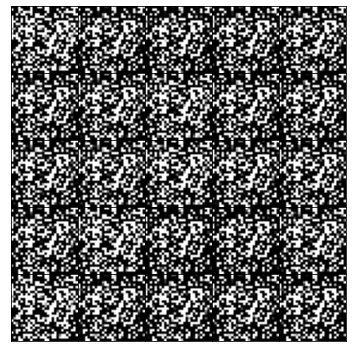

100%|██████████| 600/600 [00:50<00:00, 11.88it/s]


Epoch 70 of 100 with 50.52 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


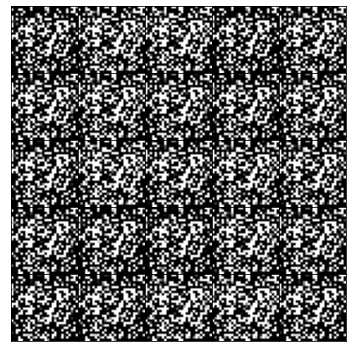

100%|██████████| 600/600 [00:49<00:00, 12.04it/s]


Epoch 71 of 100 with 49.84 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


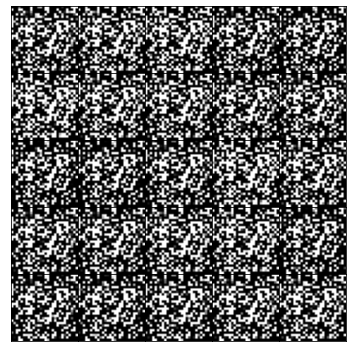

100%|██████████| 600/600 [00:49<00:00, 12.01it/s]


Epoch 72 of 100 with 49.95 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


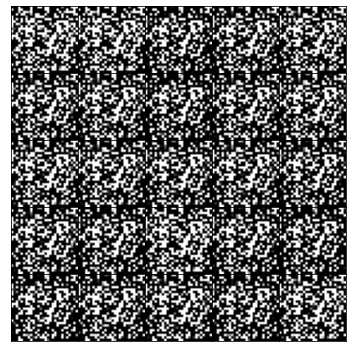

100%|██████████| 600/600 [00:49<00:00, 12.04it/s]


Epoch 73 of 100 with 49.82 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


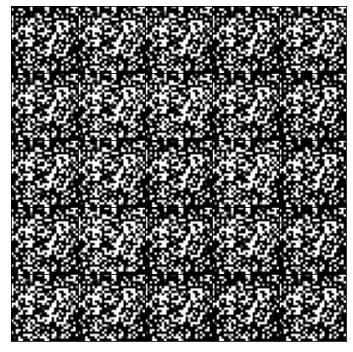

100%|██████████| 600/600 [00:49<00:00, 12.12it/s]


Epoch 74 of 100 with 49.52 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


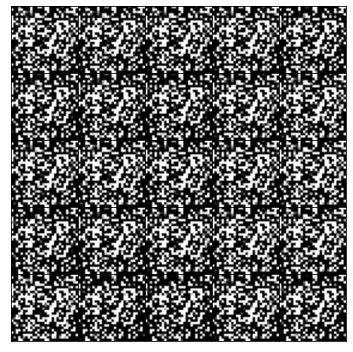

100%|██████████| 600/600 [00:49<00:00, 12.06it/s]


Epoch 75 of 100 with 49.75 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


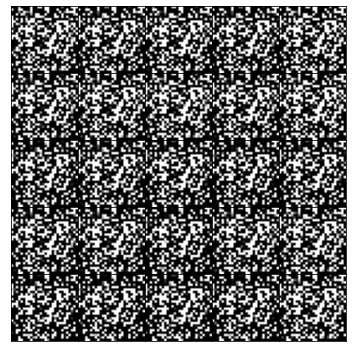

100%|██████████| 600/600 [00:50<00:00, 11.94it/s]


Epoch 76 of 100 with 50.24 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


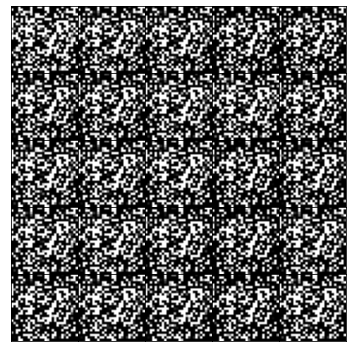

100%|██████████| 600/600 [00:49<00:00, 12.00it/s]


Epoch 77 of 100 with 49.99 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


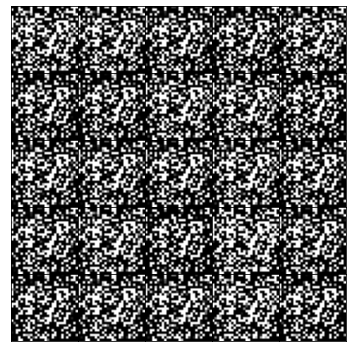

100%|██████████| 600/600 [00:49<00:00, 12.06it/s]


Epoch 78 of 100 with 49.75 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


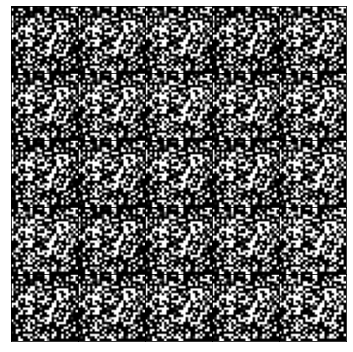

100%|██████████| 600/600 [00:50<00:00, 11.89it/s]


Epoch 79 of 100 with 50.48 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


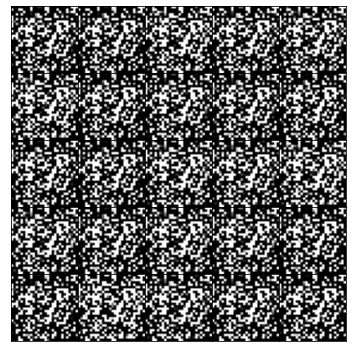

100%|██████████| 600/600 [00:50<00:00, 11.85it/s]


Epoch 80 of 100 with 50.64 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


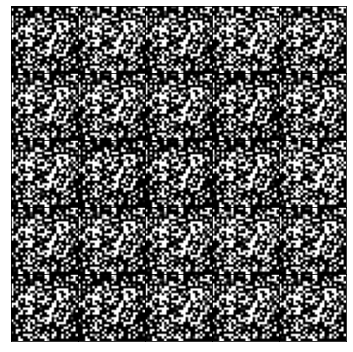

100%|██████████| 600/600 [00:50<00:00, 11.82it/s]


Epoch 81 of 100 with 50.78 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


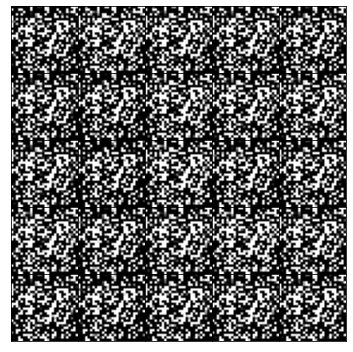

100%|██████████| 600/600 [00:50<00:00, 11.88it/s]


Epoch 82 of 100 with 50.52 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


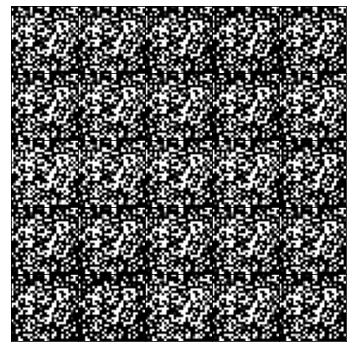

100%|██████████| 600/600 [00:50<00:00, 11.87it/s]


Epoch 83 of 100 with 50.54 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


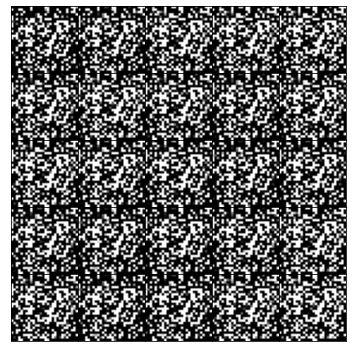

100%|██████████| 600/600 [00:50<00:00, 11.87it/s]


Epoch 84 of 100 with 50.53 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


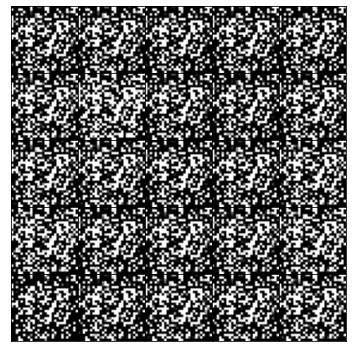

100%|██████████| 600/600 [00:50<00:00, 11.86it/s]


Epoch 85 of 100 with 50.60 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


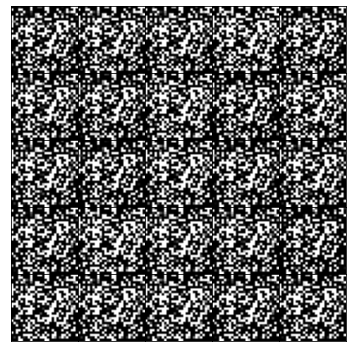

100%|██████████| 600/600 [00:51<00:00, 11.67it/s]


Epoch 86 of 100 with 51.40 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


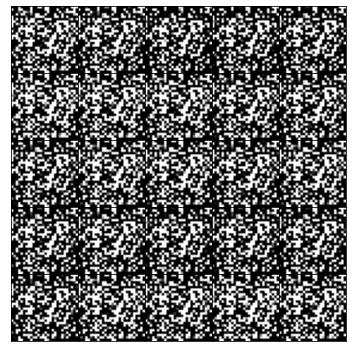

100%|██████████| 600/600 [00:51<00:00, 11.61it/s]


Epoch 87 of 100 with 51.69 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


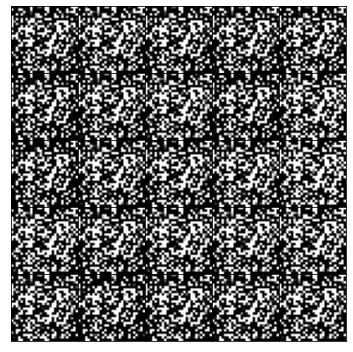

100%|██████████| 600/600 [00:53<00:00, 11.12it/s]


Epoch 88 of 100 with 53.97 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


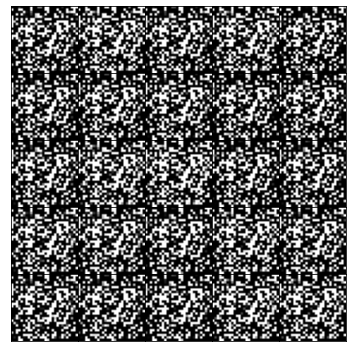

100%|██████████| 600/600 [00:51<00:00, 11.70it/s]


Epoch 89 of 100 with 51.29 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


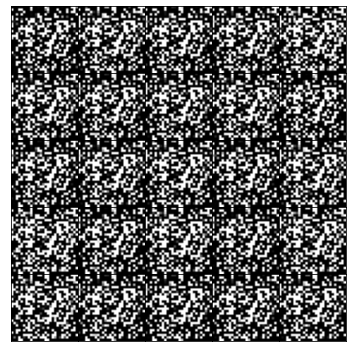

100%|██████████| 600/600 [00:51<00:00, 11.59it/s]


Epoch 90 of 100 with 51.77 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


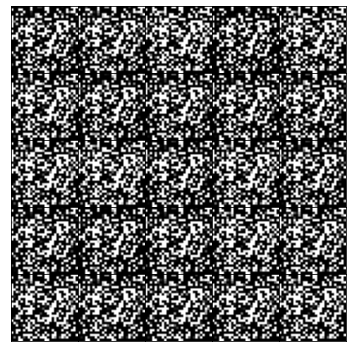

100%|██████████| 600/600 [00:51<00:00, 11.64it/s]


Epoch 91 of 100 with 51.53 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


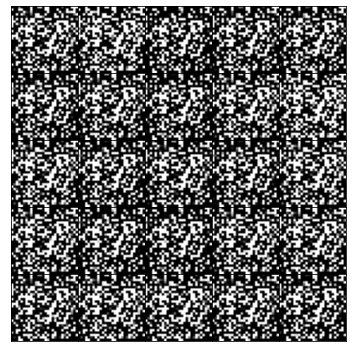

100%|██████████| 600/600 [00:51<00:00, 11.57it/s]


Epoch 92 of 100 with 51.85 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


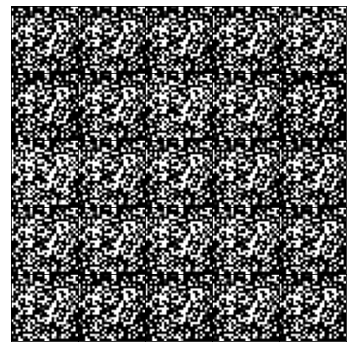

100%|██████████| 600/600 [00:50<00:00, 11.85it/s]


Epoch 93 of 100 with 50.63 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


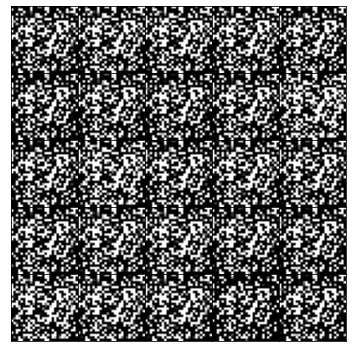

100%|██████████| 600/600 [00:50<00:00, 11.84it/s]


Epoch 94 of 100 with 50.67 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


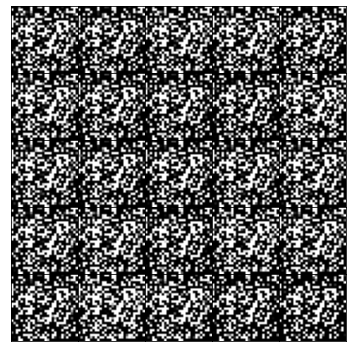

100%|██████████| 600/600 [00:50<00:00, 11.86it/s]


Epoch 95 of 100 with 50.61 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


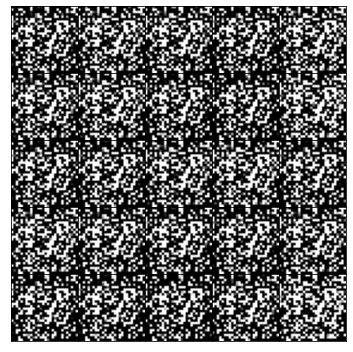

100%|██████████| 600/600 [00:50<00:00, 11.88it/s]


Epoch 96 of 100 with 50.51 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


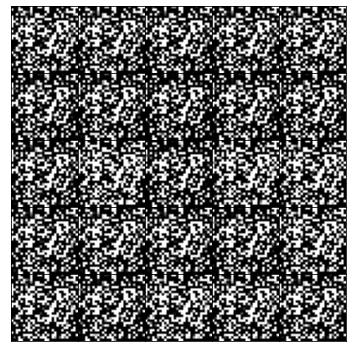

100%|██████████| 600/600 [00:50<00:00, 11.94it/s]


Epoch 97 of 100 with 50.27 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


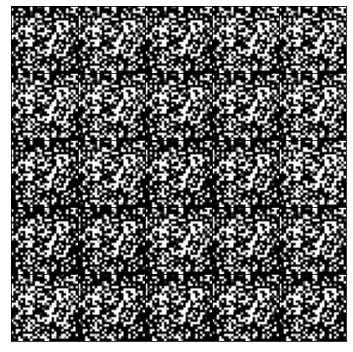

100%|██████████| 600/600 [00:50<00:00, 11.96it/s]


Epoch 98 of 100 with 50.17 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


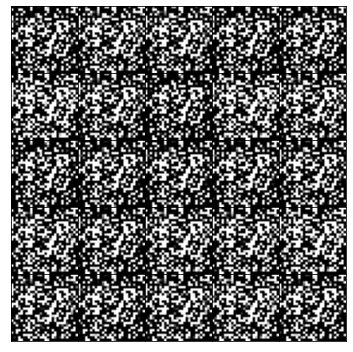

100%|██████████| 600/600 [00:50<00:00, 11.92it/s]


Epoch 99 of 100 with 50.32 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


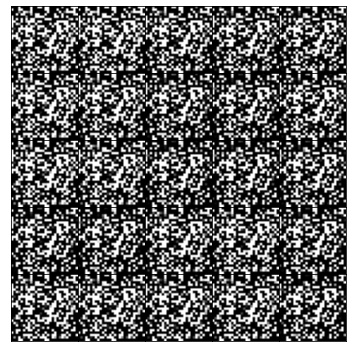

100%|██████████| 600/600 [00:50<00:00, 11.94it/s]


Epoch 100 of 100 with 50.27 s
Generator loss: 100.00000000, Discriminator loss: 0.00000000


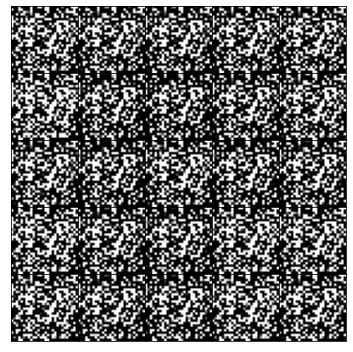

In [18]:
# training loop
for epoch in range(epochs):
    G_net.train()
    D_net.train()
    Loss_G = []
    Loss_D = []
    epoch_start_time = time.time()
    for (image, _) in tqdm(train_loader):
        image = image.to(device)
        b_size = len(image)
        # creat real and fake labels
        real_label = torch.ones(b_size, 1).to(device)
        fake_label = torch.zeros(b_size, 1).to(device)

        # generate fake images 
        data_fake = G_net(create_noise(b_size, G_input_dim).to(device))
        data_real = image.view(b_size, D_input_dim)

        # --------train the discriminator network----------
        # compute the loss for real and fake images
        output_real = D_net(data_real)
        output_fake = D_net(data_fake)
        loss_real = criterion(output_real, real_label)
        loss_fake = criterion(output_fake, fake_label)
        loss_d = loss_real + loss_fake

        # back propagation
        D_optimizer.zero_grad()
        loss_d.backward()
        D_optimizer.step()

        # -------- train the generator network-----------
        data_fake = G_net(create_noise(b_size, G_input_dim).to(device))

        # compute the loss for generator network
        output_fake = D_net(data_fake)
        loss_g = criterion(output_fake, real_label)

        ## back propagation
        G_optimizer.zero_grad()
        loss_g.backward()
        G_optimizer.step()

        ## store the loss of each iter
        Loss_D.append(loss_d.item())
        Loss_G.append(loss_g.item())

    epoch_loss_g = np.mean(Loss_G)  # mean generator loss for the epoch
    epoch_loss_d = np.mean(Loss_D)  # mean discriminator loss for the epoch
    epoch_end_time = time.time()
    per_epoch_ptime = epoch_end_time - epoch_start_time

    print("Epoch %d of %d with %.2f s" % (epoch + 1, epochs, per_epoch_ptime))
    print("Generator loss: %.8f, Discriminator loss: %.8f" % (epoch_loss_g, epoch_loss_d))

    path = image_save_dir + '/MNIST_GAN_' + str(epoch + 1) + '.png'
    show_result(G_net, create_noise(25, 100).to(device), (epoch + 1), save=True, path=path)

    # record the loss for every epoch
    train_hist['G_losses'].append(epoch_loss_g)
    train_hist['D_losses'].append(epoch_loss_d)
    train_hist['per_epoch_ptimes'].append(per_epoch_ptime)

In [19]:
end_time = time.time()
total_ptime = end_time - start_time
train_hist['total_ptime'].append(total_ptime)

In [20]:
print('Avg per epoch ptime: %.2f, total %d epochs ptime: %.2f' % (
    np.mean(train_hist['per_epoch_ptimes']), epochs, total_ptime))
print("Training finish!... save training results")

Avg per epoch ptime: 63.18, total 100 epochs ptime: 14700.48
Training finish!... save training results


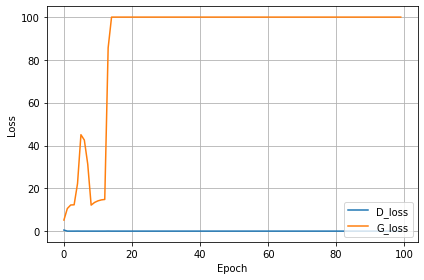

In [21]:
with open(save_dir + '/train_hist.pkl', 'wb') as f:
    pickle.dump(train_hist, f)
show_train_hist(train_hist, save=True, path=save_dir + '/MNIST_GAN_train_hist.png')

### Testing the generator

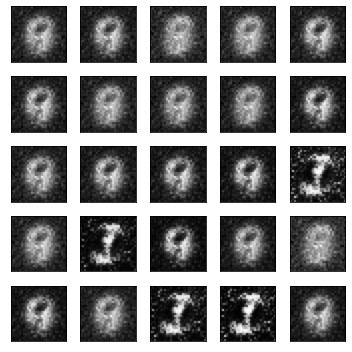

In [48]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
latent_samples = create_noise(30, 100)
if torch.cuda.is_available():
      generated_digits = G_net(latent_samples.to(device)).detach().cpu().numpy()
else:
      generated_digits = G_net(latent_samples)

plt.figure(figsize=(5, 5))
for i in range(25):
    if torch.cuda.is_available():
          img = generated_digits[i]
    else:
          img = generated_digits[i].detach()
    plt.subplot(5, 5, i+1)
    plt.imshow(img.reshape((28,28)),cmap='gray')
    plt.xticks([])
    plt.yticks([])
plt.tight_layout()
plt.show()